In [11]:
import numpy as np
import sympy as sp
import matplotlib.pyplot as plt

def optimize_functions(functions, constraints, weights, with_bonus_intersections):
    x1, x2 = sp.symbols('x1 x2')

    def check_if_point_is_valid(point):
        for constraint in constraints:
            if constraint[1] == ">=":
                if constraint[0].subs(point) < 0:
                    return False
            elif constraint[1] == "<=":
                if constraint[0].subs(point) > 0:
                    return False
        return True

    # Find all intersections of the constraints
    bonus_intersections = [
        {sp.symbols('x1'): 10, sp.symbols('x2'): 10},
        {sp.symbols('x1'): 0, sp.symbols('x2'): 20},
        {sp.symbols('x1'): 10, sp.symbols('x2'): 0},
    ]

    xs_to_check = [20]

    for i in range(len(constraints)):
        for x in xs_to_check:
            x1_val = x
            x2_val = sp.solve(constraints[i][0].subs({x1: x}), x2)
            
            for val in x2_val:
                bonus_intersections.append({x1: x1_val, x2: val})
            
    intersections = []

    if with_bonus_intersections:
        intersections.extend(filter(lambda x: check_if_point_is_valid(x), bonus_intersections))

    for i in range(len(constraints)):
        for j in range(i + 1, len(constraints)):
            eq1 = constraints[i][0]
            eq2 = constraints[j][0]

            intersection = sp.solve([eq1, eq2], dict=True)

            for point in intersection:
                valid = check_if_point_is_valid(point)
                
                if valid:
                    intersections.append(point)
                else:
                    break

    # Plotting
    max_x1 = max([point[sp.symbols('x1')] for point in intersections])
    x1_vals = np.linspace(0, float(max_x1) + 5, 400)
    max_x2 = max([point[sp.symbols('x2')] for point in intersections])
    x2_vals = np.linspace(0, float(max_x2) + 5, 400)
    x1, x2 = np.meshgrid(x1_vals, x2_vals)

    plt.figure(figsize=(10, 8))

    # Plot constraints
    for constraint, sign in constraints:
        func = sp.lambdify((sp.symbols('x1'), sp.symbols('x2')), constraint, 'numpy')
        
        if sign == ">=":
            plt.contour(x1, x2, func(x1, x2), levels=[0], colors='r', linestyles='dashed')
        elif sign == "<=":
            plt.contour(x1, x2, func(x1, x2), levels=[0], colors='b', linestyles='dashed')
        
    # Plot intersections
    for point in intersections:
        plt.plot(point[sp.symbols('x1')], point[sp.symbols('x2')], 'ro')
        plt.text(point[sp.symbols('x1')], point[sp.symbols('x2')], f"({point[sp.symbols('x1')]}, {point[sp.symbols('x2')]})")

    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.title('Constraints and Intersections')
    plt.grid(True)
    plt.show()

    # Evaluate points for the given weights
    for w in weights: 
        print(f"Weight: {w}")
        points = []
        
        if len(intersections) == 0:
            print("No intersections found")
            continue
        
        for p in intersections:
            result_val = sum([w[i] * functions[i].subs(p) for i in range(len(functions))])
            
            # print(f"Point: {p}, Value: {result_val:.2f}")

            # for (i, f) in enumerate(functions):
            #     print(f"Function: {f}, Value: {w[i]:.2f} * {f.subs(p):.2f} = {w[i] * f.subs(p):.2f}")
            
            points.append((p, result_val))
            
        best_point = min(points, key=lambda x: x[1])
        print()
        print(f"Best point for weight {w}: {best_point[0]}, Value: {best_point[1]:.2f}")
        
        if best_point[0] in bonus_intersections:
            print("Probably suboptimal solution, and optimal solution is in the infinity")
        
        for (i, f) in enumerate(functions):
            print(f"Function: {f}, Value: {w[i]:.2f} * {f.subs(best_point[0]):.2f} = {w[i] * f.subs(best_point[0]):.2f}")
            
        print("---")

# Zad. 1

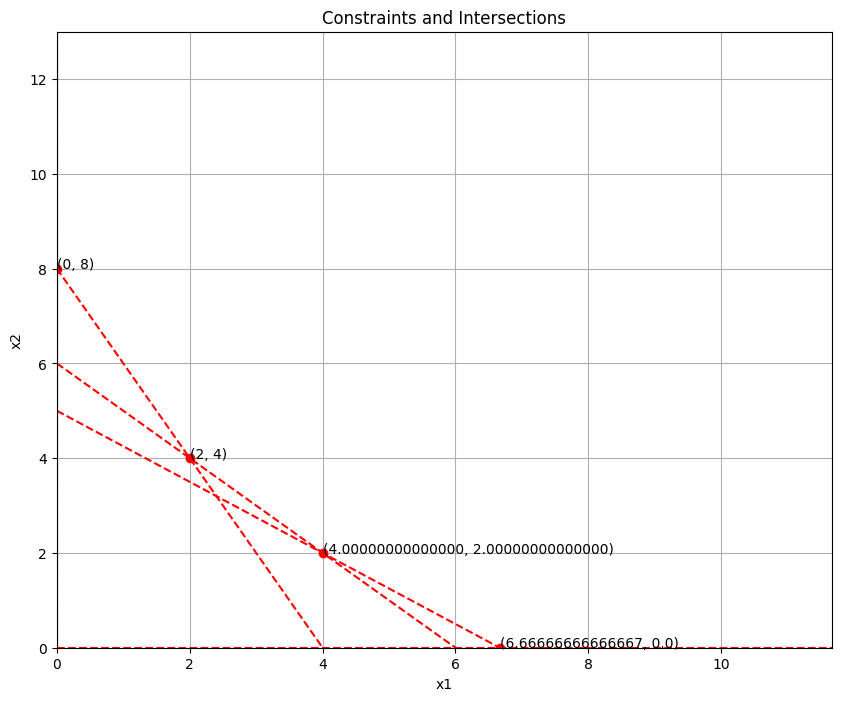

Weight: (0.5, 0.5)

Best point for weight (0.5, 0.5): {x1: 2, x2: 4}, Value: 9.00
Function: x1 + 2*x2, Value: 0.50 * 10.00 = 5.00
Function: 2*x1 + x2, Value: 0.50 * 8.00 = 4.00
---
Weight: (0.25, 0.75)

Best point for weight (0.25, 0.75): {x1: 2, x2: 4}, Value: 8.50
Function: x1 + 2*x2, Value: 0.25 * 10.00 = 2.50
Function: 2*x1 + x2, Value: 0.75 * 8.00 = 6.00
---
Weight: (0.7, 0.25)

Best point for weight (0.7, 0.25): {x1: 6.66666666666667, x2: 0.0}, Value: 8.00
Function: x1 + 2*x2, Value: 0.70 * 6.67 = 4.67
Function: 2*x1 + x2, Value: 0.25 * 13.33 = 3.33
---


In [12]:
functions = [
    sp.sympify("x1 + 2*x2"),
    sp.sympify("2*x1 + x2")
]

constraints = [
    [sp.sympify("x1 + x2 - 6"), ">="],
    [sp.sympify("2*x1 + x2 - 8"), ">="],
    [sp.sympify("0.75*x1 + x2 - 5"), ">="],
    [sp.sympify("x1"), ">="],
    [sp.sympify("x2"), ">="]
]

weights = [(0.5, 0.5), (0.25, 0.75), (0.7, 0.25)]

optimize_functions(functions, constraints, weights, with_bonus_intersections=False)

# Zad 2

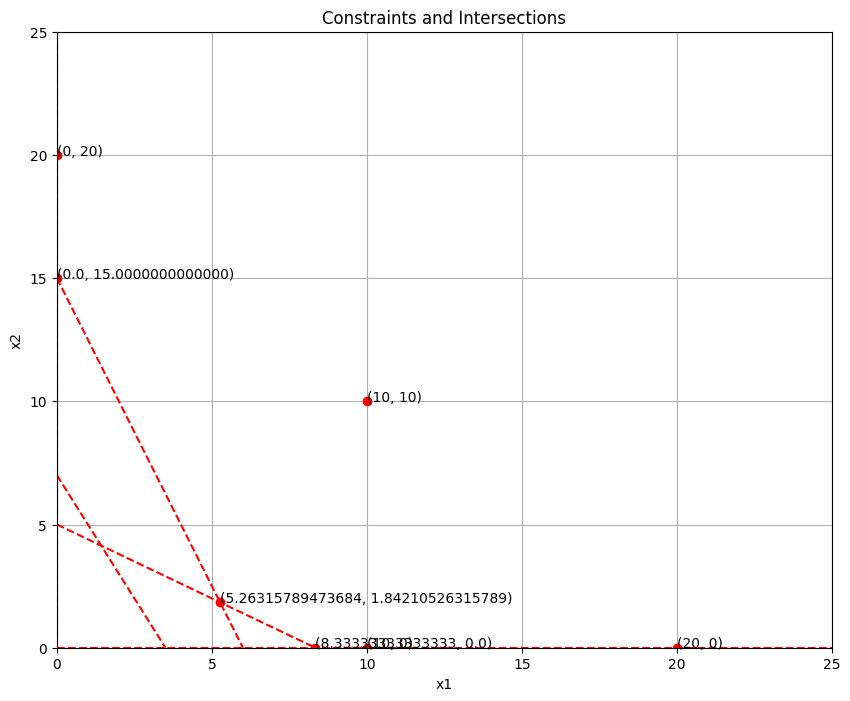

Weight: (0.5, 0.5)

Best point for weight (0.5, 0.5): {x1: 5.26315789473684, x2: 1.84210526315789}, Value: 19.47
Function: 4*x1 + 3*x2, Value: 0.50 * 26.58 = 13.29
Function: 2*x1 + x2, Value: 0.50 * 12.37 = 6.18
---
Weight: (0.25, 0.75)

Best point for weight (0.25, 0.75): {x1: 5.26315789473684, x2: 1.84210526315789}, Value: 15.92
Function: 4*x1 + 3*x2, Value: 0.25 * 26.58 = 6.64
Function: 2*x1 + x2, Value: 0.75 * 12.37 = 9.28
---
Weight: (0.7, 0.25)

Best point for weight (0.7, 0.25): {x1: 5.26315789473684, x2: 1.84210526315789}, Value: 21.70
Function: 4*x1 + 3*x2, Value: 0.70 * 26.58 = 18.61
Function: 2*x1 + x2, Value: 0.25 * 12.37 = 3.09
---


In [13]:
functions = [
    sp.sympify("4*x1 + 3*x2"),
    sp.sympify("2*x1 + x2")
]

constraints = [
    [sp.sympify("x1 + 0.4*x2 - 6"), ">="],
    [sp.sympify("2*x1 + x2 - 7"), ">="],
    [sp.sympify("0.6*x1 + x2 - 5"), ">="],
    [sp.sympify("x1"), ">="],
    [sp.sympify("x2"), ">="]
]

weights = [(0.5, 0.5), (0.25, 0.75), (0.7, 0.25)]

optimize_functions(functions, constraints, weights, with_bonus_intersections=True)

# Zad 7

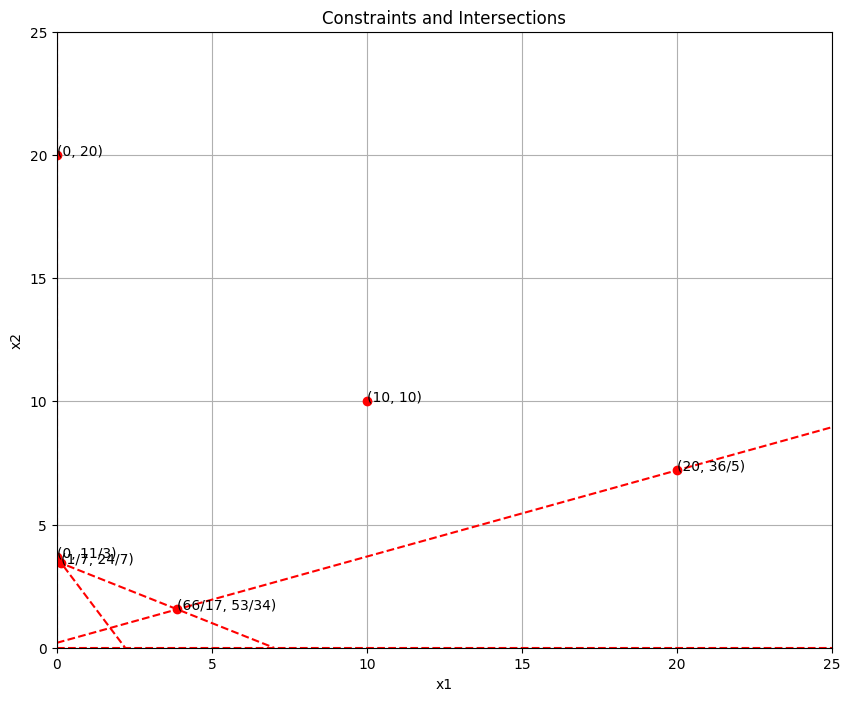

Weight: (0.5, 0.5)

Best point for weight (0.5, 0.5): {x1: 1/7, x2: 24/7}, Value: 9.07
Function: 8*x1 + 3*x2, Value: 0.50 * 11.43 = 5.71
Function: -x1 + 2*x2, Value: 0.50 * 6.71 = 3.36
---
Weight: (0.25, 0.75)

Best point for weight (0.25, 0.75): {x1: 1/7, x2: 24/7}, Value: 7.89
Function: 8*x1 + 3*x2, Value: 0.25 * 11.43 = 2.86
Function: -x1 + 2*x2, Value: 0.75 * 6.71 = 5.04
---
Weight: (0.75, 0.25)

Best point for weight (0.75, 0.25): {x1: 0, x2: 11/3}, Value: 10.08
Function: 8*x1 + 3*x2, Value: 0.75 * 11.00 = 8.25
Function: -x1 + 2*x2, Value: 0.25 * 7.33 = 1.83
---


In [14]:
functions = [
    sp.sympify("8*x1 + 3*x2"),
    sp.sympify("-x1 + 2*x2")
]

constraints = [
    [sp.sympify("5*x1 + 3*x2 - 11"), ">="],
    [sp.sympify("x1 + 2*x2 - 7"), ">="],
    [sp.sympify("-7*x1 + 20*x2 - 4"), ">="],
    [sp.sympify("x1"), ">="],
    [sp.sympify("x2"), ">="]
]

weights = [(0.5, 0.5), (0.25, 0.75), (0.75, 0.25)]

optimize_functions(functions, constraints, weights, with_bonus_intersections=True)

# Zad 8

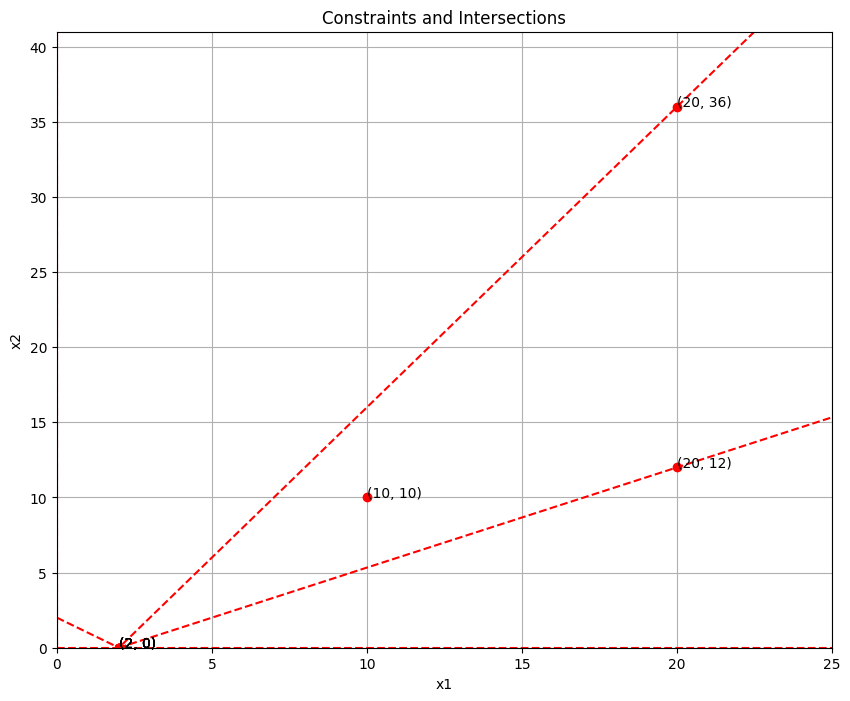

Weight: (0.5, 0.5)

Best point for weight (0.5, 0.5): {x1: 2, x2: 0}, Value: -2.00
Function: -4*x1 + 3*x2, Value: 0.50 * -8.00 = -4.00
Function: 2*x1 + 5*x2, Value: 0.50 * 4.00 = 2.00
---
Weight: (0.25, 0.75)

Best point for weight (0.25, 0.75): {x1: 2, x2: 0}, Value: 1.00
Function: -4*x1 + 3*x2, Value: 0.25 * -8.00 = -2.00
Function: 2*x1 + 5*x2, Value: 0.75 * 4.00 = 3.00
---
Weight: (0.7, 0.25)

Best point for weight (0.7, 0.25): {x1: 20, x2: 12}, Value: -5.80
Probably suboptimal solution, and optimal solution is in the infinity
Function: -4*x1 + 3*x2, Value: 0.70 * -44.00 = -30.80
Function: 2*x1 + 5*x2, Value: 0.25 * 100.00 = 25.00
---


In [15]:
# Define variables
x1, x2 = sp.symbols('x1 x2')

# Define functions
functions = [
    -4*x1 + 3*x2,
    2*x1 + 5*x2
]

# Define constraints
constraints = [
    [x1 + x2 - 2, ">="],
    [-2*x1 + 3*x2 + 4, ">="],
    [2*x1 - x2 - 4, ">="],
    [x1, ">="],
    [x2, ">="]
]

weights = [(0.5, 0.5), (0.25, 0.75), (0.7, 0.25)]

optimize_functions(functions, constraints, weights, with_bonus_intersections=True)

# Plotter of feasible region

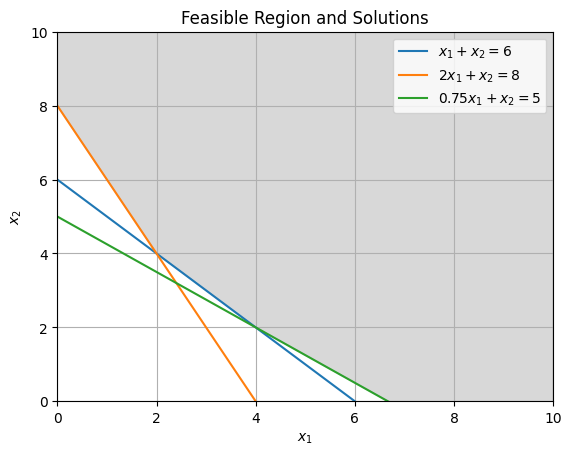

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import linprog

# Define the objective functions
def f1(x1, x2):
    return x1 + 2 * x2

def f2(x1, x2):
    return 2 * x1 + x2

# Define the constraints
x1 = np.linspace(0, 10, 400)
x2_1 = 6 - x1  # x1 + x2 >= 6
x2_2 = (8 - 2 * x1)  # 2x1 + x2 >= 8
x2_3 = (5 - 0.75 * x1)  # 0.75x1 + x2 >= 5

# Plot the constraints
plt.plot(x1, x2_1, label='$x_1 + x_2 = 6$')
plt.plot(x1, x2_2, label='$2x_1 + x_2 = 8$')
plt.plot(x1, x2_3, label='$0.75x_1 + x_2 = 5$')

# Fill the feasible region
plt.fill_between(x1, np.maximum(np.maximum(x2_1, x2_2), x2_3), 10, color='gray', alpha=0.3)

# Define the weights for the weighted sum method
weights = np.array([[0.5, 0.5], [0.3, 0.7], [0.7, 0.3]])

# Solve the problem for each weight combination and plot the solutions
for w in weights:
    c = w[0] * np.array([1, 2]) + w[1] * np.array([2, 1])
    res = linprog(c, A_ub=[[-1, -1], [-2, -1], [-0.75, -1], [1, 0], [0, 1]], b_ub=[-6, -8, -5, 0, 0], method='highs')
    if res.success:
        plt.plot(res.x[0], res.x[1], 'ro')
        plt.text(res.x[0], res.x[1], f'({res.x[0]:.2f}, {res.x[1]:.2f})')

# Labels and legend
plt.xlim(0, 10)
plt.ylim(0, 10)
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.title('Feasible Region and Solutions')
plt.legend()
plt.grid(True)
plt.show()

# Solver using minimize

In [17]:
import numpy as np
from scipy.optimize import minimize

# Definicje funkcji celu
def f1(x):
    return x[0] + 2*x[1]

def f2(x):
    return 2*x[0] + x[1]

# Ograniczenia
constraints = [
    {'type': 'ineq', 'fun': lambda x: x[0] + x[1] - 6},
    {'type': 'ineq', 'fun': lambda x: 2*x[0] + x[1] - 8},
    {'type': 'ineq', 'fun': lambda x: 0.75*x[0] + x[1] - 5},
    {'type': 'ineq', 'fun': lambda x: x[0]},
    {'type': 'ineq', 'fun': lambda x: x[1]}
]

# Wagi
weights = [(0.5, 0.5), (0.25, 0.75), (0.75, 0.25)]

# Początkowy punkt (dobrze jest wybrać punkt spełniający ograniczenia)
x0 = np.array([4, 4])

# Funkcja do optymalizacji
def objective(x, w1, w2):
    return w1 * f1(x) + w2 * f2(x)

# Wyniki dla różnych wag
results = {}
for w1, w2 in weights:
    result = minimize(objective, x0, args=(w1, w2), constraints=constraints)
    results[(w1, w2)] = (result.x, result.fun, f1(result.x), f2(result.x))

# Wyświetlenie wyników
for weights, (x, fun, val_f1, val_f2) in results.items():
    print(f"Wagi: {weights}, x: {x}, wartość funkcji celu: {fun}, f1(x): {val_f1}, f2(x): {val_f2}")

Wagi: (0.5, 0.5), x: [3. 3.], wartość funkcji celu: 9.0, f1(x): 9.0, f2(x): 9.0
Wagi: (0.25, 0.75), x: [2. 4.], wartość funkcji celu: 8.499999999999925, f1(x): 9.999999999999929, f2(x): 7.999999999999925
Wagi: (0.75, 0.25), x: [6.66666667e+00 2.37587727e-14], wartość funkcji celu: 8.333333333333398, f1(x): 6.666666666666734, f2(x): 13.333333333333394


# Solver using pulp

In [18]:
import pulp

# Definicje funkcji celu jako wyrażenia liniowe
def f1(x1, x2):
    return x1 + 2*x2

def f2(x1, x2):
    return 2*x1 + x2

# Wagi
weights = [(0.5, 0.5), (0.25, 0.75), (0.75, 0.25)]

# Rozwiązania dla różnych wag
results = {}

for w1, w2 in weights:
    # Utworzenie problemu optymalizacyjnego
    prob = pulp.LpProblem("Problem", pulp.LpMinimize)

    # Zmienne decyzyjne
    x1 = pulp.LpVariable("x1", lowBound=0)
    x2 = pulp.LpVariable("x2", lowBound=0)

    # Funkcja celu
    prob += w1 * f1(x1, x2) + w2 * f2(x1, x2), "Weighted Objective"

    # Ograniczenia
    prob += x1 + x2 >= 6
    prob += 2*x1 + x2 >= 8
    prob += 0.75*x1 + x2 >= 5

    # Rozwiązanie problemu
    prob.solve()

    # Zapisanie wyników
    results[(w1, w2)] = (pulp.value(x1), pulp.value(x2), pulp.value(prob.objective), 
                         f1(pulp.value(x1), pulp.value(x2)), f2(pulp.value(x1), pulp.value(x2)))

# Wyświetlenie wyników
for weights, (x1_val, x2_val, obj_val, val_f1, val_f2) in results.items():
    print(f"Wagi: {weights}, x1: {x1_val}, x2: {x2_val}, wartość funkcji celu: {obj_val}, f1(x): {val_f1}, f2(x): {val_f2}")

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/rei/.pyenv/versions/3.11.9/lib/python3.11/site-packages/pulp/solverdir/cbc/linux/64/cbc /tmp/b2e4dbbecf614e738b240c76adbd69a1-pulp.mps -timeMode elapsed -branch -printingOptions all -solution /tmp/b2e4dbbecf614e738b240c76adbd69a1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 8 COLUMNS
At line 17 RHS
At line 21 BOUNDS
At line 22 ENDATA
Problem MODEL has 3 rows, 2 columns and 6 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Presolve 3 (0) rows, 2 (0) columns and 6 (0) elements
0  Obj 0 Primal inf 19 (3)
3  Obj 9
Optimal - objective value 9
Optimal objective 9 - 3 iterations time 0.002
Option for printingOptions changed from normal to all
Total time (CPU seconds):       0.00   (Wallclock seconds):       0.00

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /home/rei/.pyenv

# 3D graph with function values

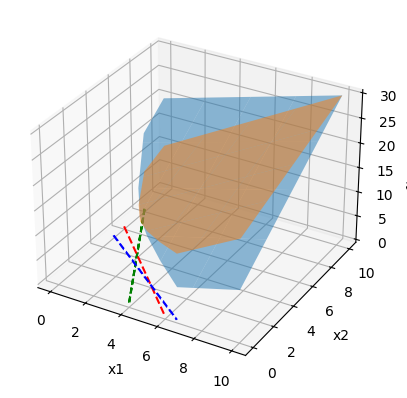

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

# Definiowanie funkcji celu
def f1(x1, x2):
    return x1 + 2 * x2

def f2(x1, x2):
    return 2 * x1 + x2

# Zakres wartości dla x1 i x2
x1 = np.linspace(0, 10, 400)
x2 = np.linspace(0, 10, 400)
X1, X2 = np.meshgrid(x1, x2)

# Obliczanie wartości funkcji celu
Z1 = f1(X1, X2)
Z2 = f2(X1, X2)

# Ograniczenia
constraint1 = X1 + X2 >= 6
constraint2 = 2 * X1 + X2 >= 8
constraint3 = 0.75 * X1 + X2 >= 5

# Maskowanie wartości poza ograniczeniami
Z1 = np.ma.masked_where(~(constraint1 & constraint2 & constraint3), Z1)
Z2 = np.ma.masked_where(~(constraint1 & constraint2 & constraint3), Z2)

# Rysowanie wykresu 3D z matplotlib
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, Z1, alpha=0.5, rstride=100, cstride=100, label='f1(x1, x2)')
ax.plot_surface(X1, X2, Z2, alpha=0.5, rstride=100, cstride=100, label='f2(x1, x2)')

# Rysowanie ograniczeń na płaszczyźnie x1, x2
ax.contour(X1, X2, constraint1, levels=[0], colors='r', linestyles='dashed')
ax.contour(X1, X2, constraint2, levels=[0], colors='g', linestyles='dashed')
ax.contour(X1, X2, constraint3, levels=[0], colors='b', linestyles='dashed')

ax.set_xlabel('x1')
ax.set_ylabel('x2')
ax.set_zlabel('f(x1, x2)')
plt.show()

# Rysowanie wykresu 3D z plotly
fig = go.Figure()

fig.add_trace(go.Surface(z=Z1, x=x1, y=x2, colorscale='Viridis', opacity=0.5, name="f1(x1, x2)"))
fig.add_trace(go.Surface(z=Z2, x=x1, y=x2, colorscale='RdBu', opacity=0.5, name="f2(x1, x2)"))

# Dodawanie ograniczeń na płaszczyźnie x1, x2
fig.add_trace(go.Scatter3d(x=[0, 10], y=[6, 0], z=[0, 0], mode='lines', line=dict(color='red', dash='dash'), name='x1 + x2 >= 6'))
fig.add_trace(go.Scatter3d(x=[0, 10], y=[8, -2], z=[0, 0], mode='lines', line=dict(color='green', dash='dash'), name='2x1 + x2 >= 8'))
fig.add_trace(go.Scatter3d(x=[0, 6.67], y=[5, 0], z=[0, 0], mode='lines', line=dict(color='blue', dash='dash'), name='0.75x1 + x2 >= 5'))

fig.update_layout(scene=dict(
                    xaxis_title='x1',
                    yaxis_title='x2',
                    zaxis_title='f(x1, x2)'),
                  title="Interaktywny wykres 3D funkcji celu z ograniczeniami")

fig.show()